Useful Notebook for Deformable DETR: https://github.com/NielsRogge/Transformers-Tutorials/blob/master/Deformable-DETR/Inference_with_Deformable_DETR_(CPU).ipynb

## Imports

In [1]:
import os
os.chdir('OW-DETR') # if we're not in the right directory

In [2]:
from models.backbone import build_backbone
from models.deformable_transformer import build_deforamble_transformer
from models.deformable_detr import build
from util.misc import NestedTensor

In [3]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
from PIL import Image
import requests
import numpy as np

from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt

cuda


## Useful Functions

In [17]:
# Load and preprocess the image
def preprocess(image_path, device=device):
    transform = T.Compose([
        T.Resize(800),  # Assuming 800 is the input size for the model
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension
    return image_tensor, image

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32).to(device)
    return b

In [32]:
def detect(image_tensor, model, im_size):
    # propagate through the model
    outputs = model(image_tensor)

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    print(probas)
    keep = probas.max(-1).values > 0.3

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im_size)
    return probas[keep], bboxes_scaled

In [10]:
# COCO classes
# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3, alpha=0.8))
        cl = p.argmax()
        # text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        # ax.text(xmin, ymin, bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Load OW-DETR

In [4]:
checkpoint = torch.load("../pretrained/checkpoint0044.pth", map_location=device)
print(checkpoint['args'])

Namespace(lr=0.0002, lr_backbone_names=['backbone.0'], lr_backbone=2e-05, lr_linear_proj_names=['reference_points', 'sampling_offsets'], lr_linear_proj_mult=0.1, batch_size=2, weight_decay=0.0001, epochs=45, lr_drop=40, lr_drop_epochs=None, clip_max_norm=0.1, sgd=False, with_box_refine=False, two_stage=False, frozen_weights=None, dilation=False, position_embedding='sine', position_embedding_scale=6.283185307179586, num_feature_levels=4, enc_layers=6, dec_layers=6, dim_feedforward=1024, hidden_dim=256, dropout=0.1, nheads=8, num_queries=100, dec_n_points=4, enc_n_points=4, masks=False, aux_loss=True, set_cost_class=2, set_cost_bbox=5, set_cost_giou=2, mask_loss_coef=1, dice_loss_coef=1, cls_loss_coef=2, bbox_loss_coef=5, giou_loss_coef=2, focal_alpha=0.25, coco_panoptic_path=None, remove_difficult=False, output_dir='exps/OWOD_t1_new_split', device='cuda', seed=42, resume='', start_epoch=0, eval=False, viz=False, eval_every=5, num_workers=2, cache_mode=False, PREV_INTRODUCED_CLS=0, CUR_I

In [5]:
model, criterion, postprocessors = build(checkpoint['args'])
model = model.to(device)

81
DINO resnet50


/mnt/c/Users/Sergiu/Desktop/AnomalyDetection/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/mnt/c/Users/Sergiu/Desktop/AnomalyDetection/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Invalid class rangw: [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]


In [6]:
print(checkpoint.keys())
msg = model.load_state_dict(checkpoint['model'], strict=False)
print(msg)

dict_keys(['model', 'optimizer', 'lr_scheduler', 'epoch', 'args'])
<All keys matched successfully>


## Run Example Object Detection Flow on single Image

In [27]:
image_tensor, image = preprocess("../assets/demo1.jpg")

# Creating a dummy mask (all ones)
# mask = torch.ones(image_tensor.size(0), image_tensor.size(2), image_tensor.size(3), dtype=torch.bool)
# nested_tensor = NestedTensor(image_tensor, mask).to(device)


In [28]:
# %%timeit
# outputs = model(image_tensor)

In [29]:
outputs.keys()

dict_keys(['pred_logits', 'pred_nc_logits', 'pred_boxes', 'resnet_1024_feat', 'aux_outputs'])

In [30]:
boxes, scores = outputs['pred_boxes'], outputs['pred_logits']
print(boxes.shape, scores.shape)

torch.Size([1, 100, 4]) torch.Size([1, 100, 81])


In [33]:
# im = Image.open("../assets/demo5.jpg")

scores, boxes = detect(image_tensor, model, im_size=image.size)

tensor([[0.0047, 0.0056, 0.0091,  ..., 0.0089, 0.0081, 0.0075],
        [0.0050, 0.0016, 0.0330,  ..., 0.0145, 0.0112, 0.0030],
        [0.0025, 0.0024, 0.0160,  ..., 0.0062, 0.0060, 0.0099],
        ...,
        [0.0044, 0.0032, 0.0205,  ..., 0.0104, 0.0045, 0.0107],
        [0.0043, 0.0037, 0.0093,  ..., 0.0100, 0.0061, 0.0190],
        [0.0031, 0.0016, 0.0167,  ..., 0.0126, 0.0082, 0.0098]],
       device='cuda:0', grad_fn=<SliceBackward0>)


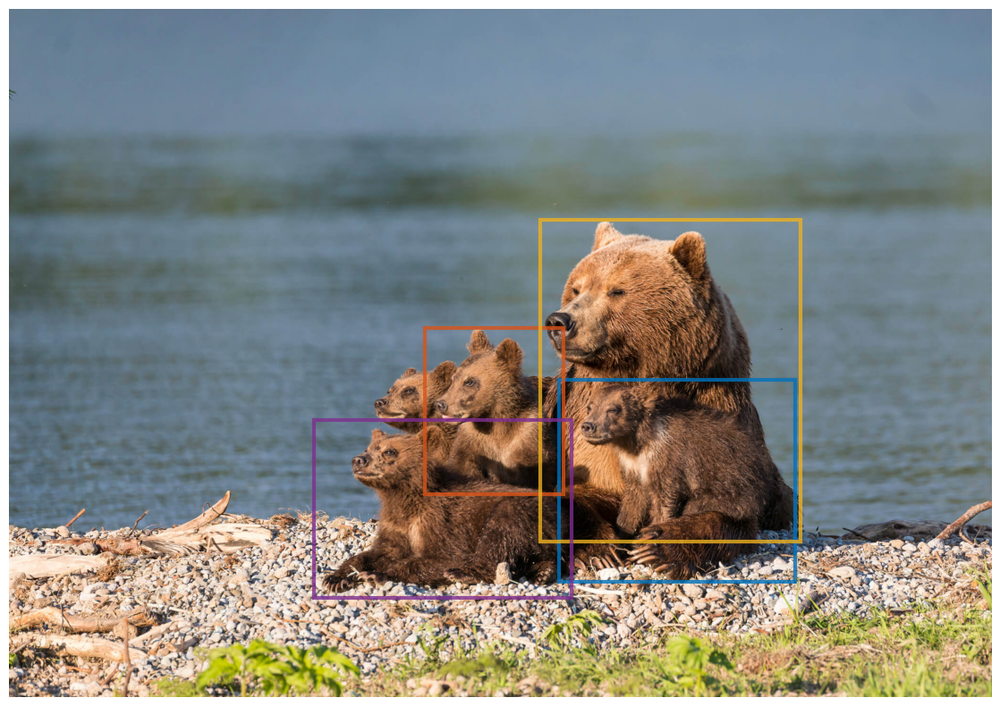

In [35]:
plot_results(image, scores, boxes)

## Run Object Detection on batch of images

In [82]:
import os
import glob

def list_image_files(directory, file_types=['*.jpg', '*.jpeg', '*.png']):
    files = []
    for file_type in file_types:
        files.extend(glob.glob(os.path.join(directory, file_type)))
    return files


In [83]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T
from util.misc import nested_tensor_from_tensor_list

class CustomDataset(Dataset):
    def __init__(self, directory, transform=None, file_types=['*.jpg', '*.jpeg', '*.png']):
        self.image_paths = list_image_files(directory, file_types)
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

def custom_collate(batch):
    # Collate function modified to create NestedTensor required by Deformable DETR
    # Assuming that each item in batch is just an image tensor
    nested_tensor = nested_tensor_from_tensor_list(batch)
    return nested_tensor

In [84]:
transform = T.Compose([
    T.Resize((500, 500)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
assets_path = "../assets/"
dataset = CustomDataset(assets_path, transform=transform)
# When creating the DataLoader
data_loader = DataLoader(dataset, batch_size=32, shuffle=False, collate_fn=custom_collate)

In [85]:
def batch_detect(nested_tensor, model, device):
    # Move the NestedTensor to the device
    nested_tensor = nested_tensor.to(device)
    
    with torch.no_grad():
        # Run the model
        outputs = model(nested_tensor)

    batch_detections = []

    # Extract tensor from NestedTensor
    tensor = nested_tensor.tensors
    for i in range(tensor.shape[0]):
        probas = outputs['pred_logits'][i].softmax(-1)[:, :-1]
        keep = probas.max(-1).values > 0.3

        # Here, the bounding boxes need to be adjusted to the original image size.
        # The model output is normalized to the image size after transformation.
        # So, you might need to adjust the bounding box scaling based on the actual size of each image.
        # Assuming you have a function to handle this:
        bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][i, keep], nested_tensor.mask[i].shape[-2:])
        batch_detections.append((probas[keep], bboxes_scaled))

    return batch_detections

In [86]:
%%timeit
for nested_tensor in data_loader:
    detections = batch_detect(nested_tensor, model, device)

1.17 s ± 6.57 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [87]:
## import matplotlib.pyplot as plt

def plot_batch_detections(images, detections_batch):
    """
    Plots the results for a batch of images and their detections.
    
    :param images: List of PIL images.
    :param detections_batch: List of detections for each image in the batch.
                             Each detection should be a tuple of (probabilities, boxes).
    """
    for img, detections in zip(images, detections_batch):
        prob, boxes = detections
        plot_results(img, prob, boxes)

def plot_results(pil_img, prob, boxes, im_size=(500, 500)):
    # Calculate scale factors for width and height
    orig_width, orig_height = pil_img.size
    scale_x = orig_width / im_size[0]
    scale_y = orig_height / im_size[1]

    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()

    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        # Scale box coordinates back to original image size
        xmin, xmax = xmin * scale_x, xmax * scale_x
        ymin, ymax = ymin * scale_y, ymax * scale_y

        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3, alpha=0.8))
        cl = p.argmax()
        # Optionally, add text for each box
        # text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        # ax.text(xmin, ymin, text, bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()



In [76]:
from PIL import Image
import os

def load_images_from_folder(folder):
    """
    Load all images in a folder into a list of PIL Image objects.

    :param folder: Path to the directory containing image files.
    :return: List of PIL Image objects.
    """
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        try:
            with Image.open(img_path) as img:
                images.append(img.copy())
        except IOError:
            # This will skip any files that aren't valid images
            print(f"Skipping file {filename}, unable to open or it's not an image file.")
    return images


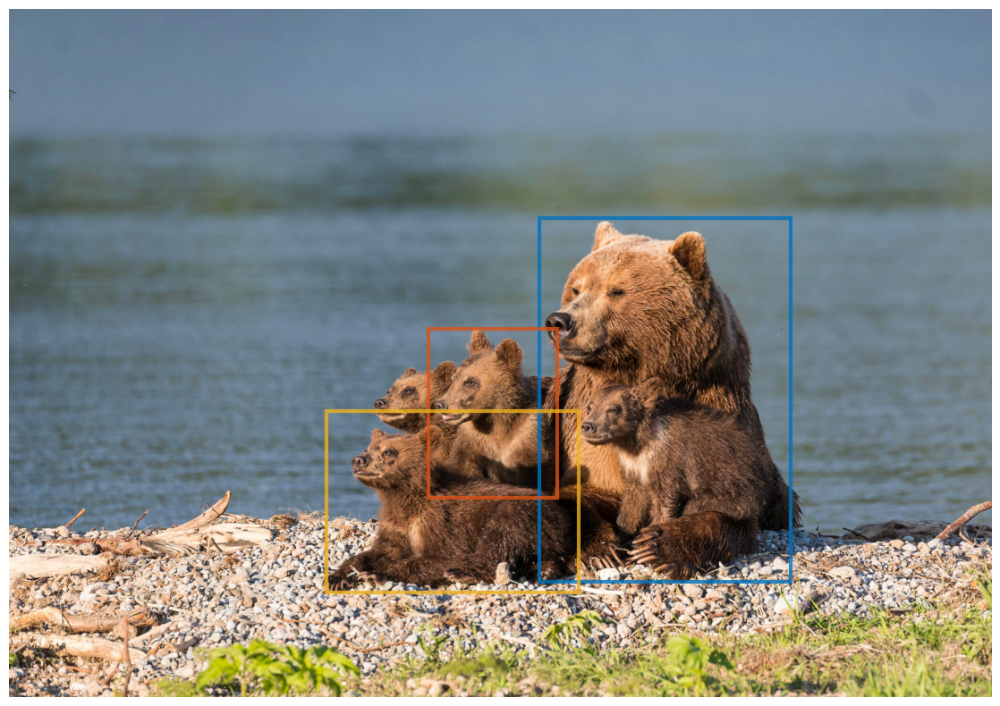

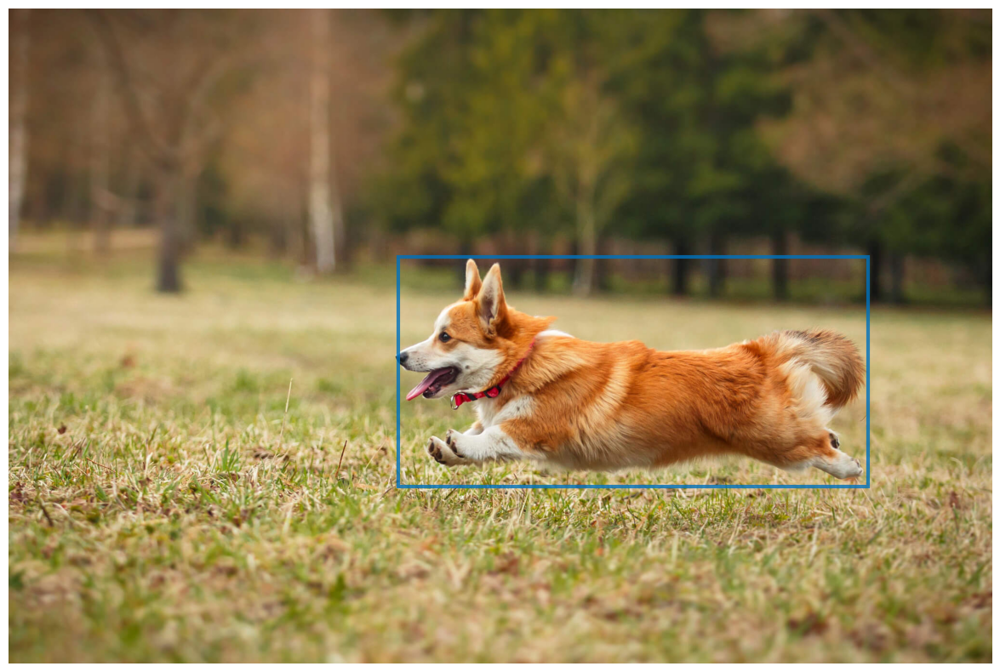

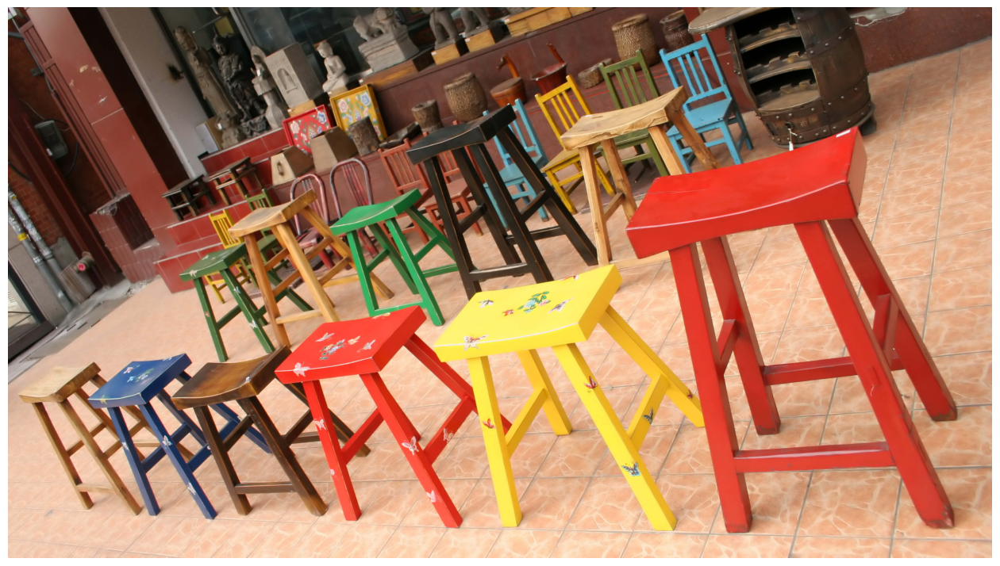

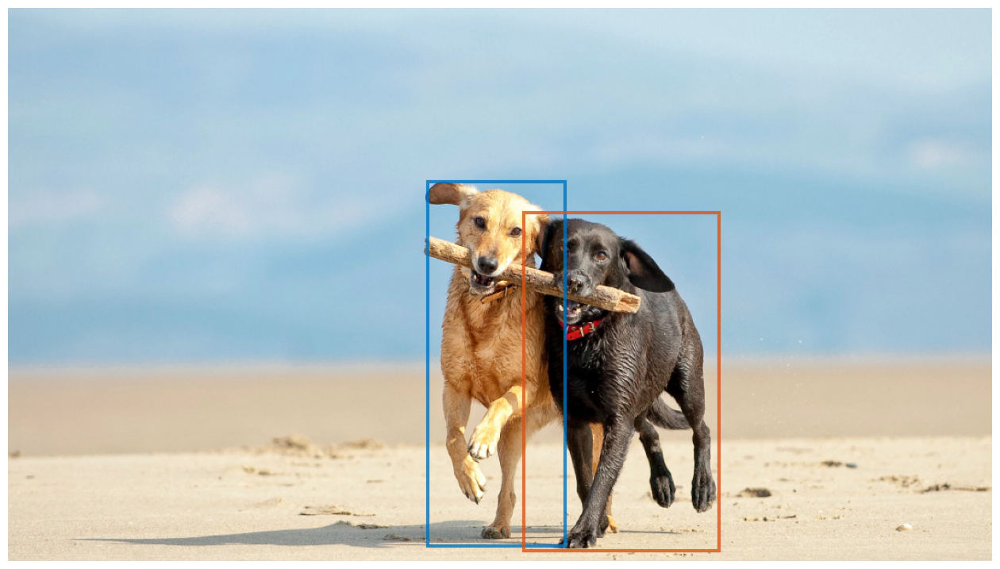

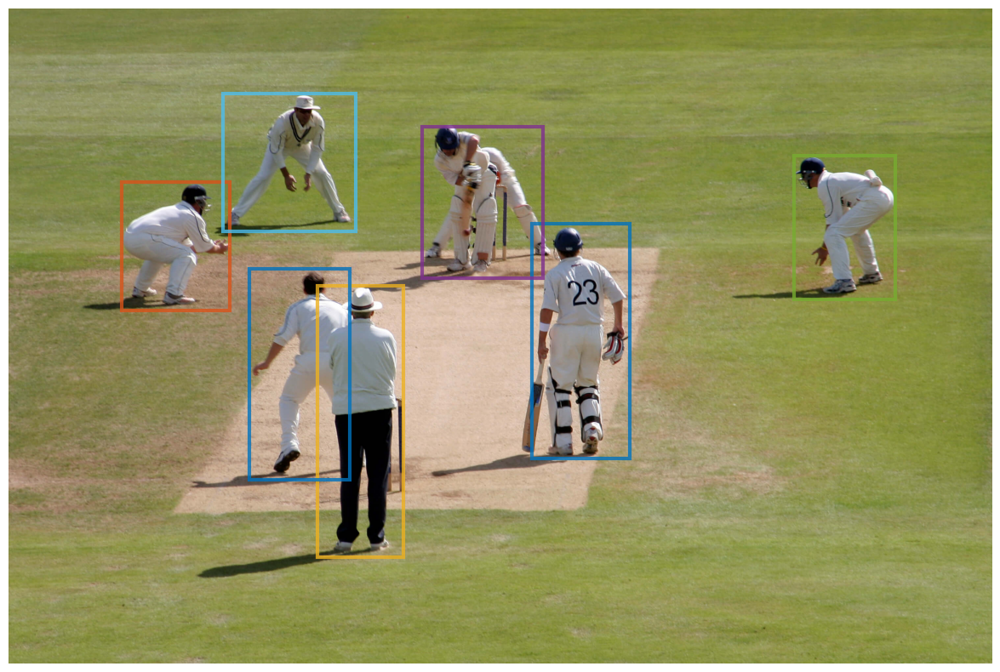

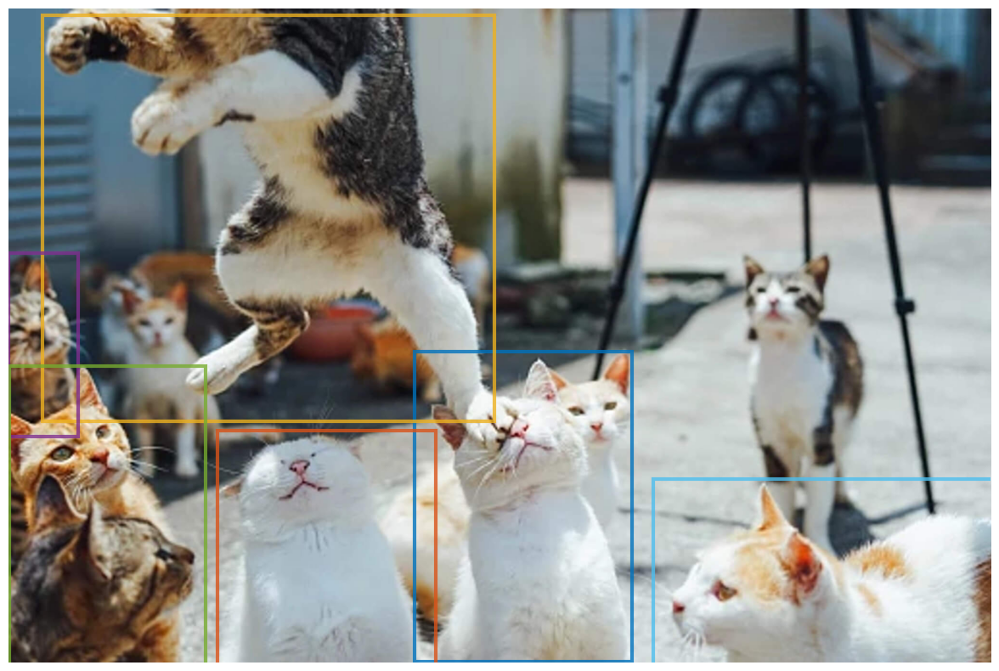

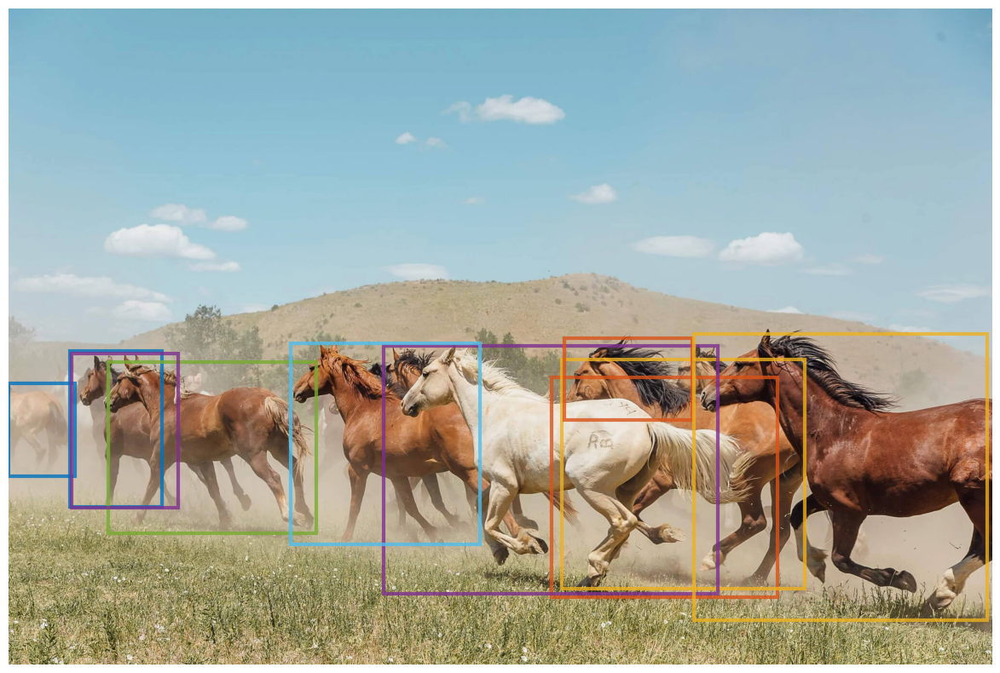

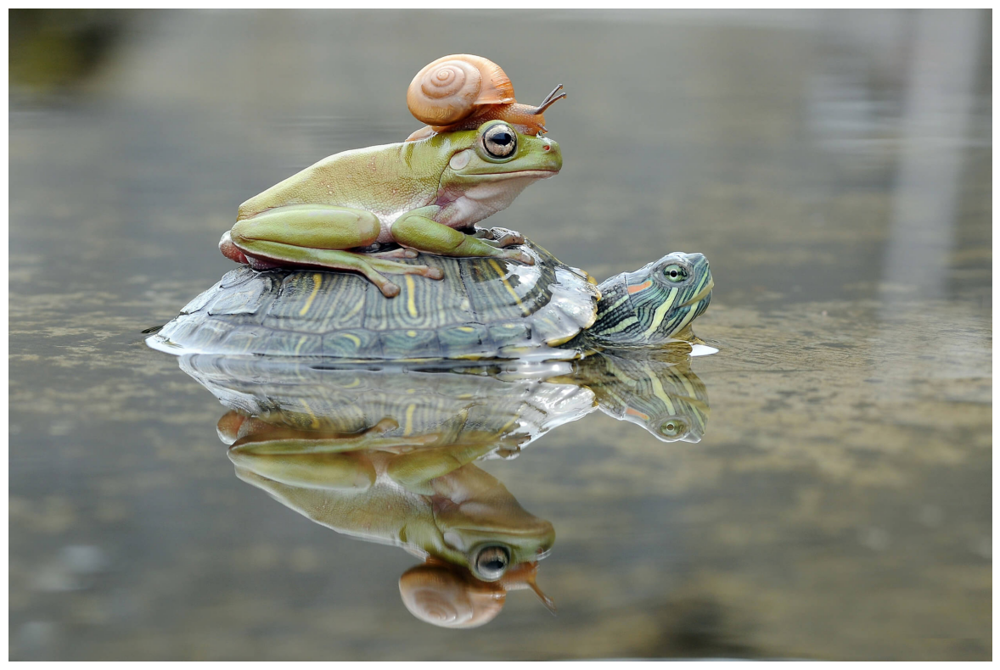

In [77]:
# Let's assume `detections` is the output from `batch_detect` function for a batch
# and `pil_images` is a list of PIL Image objects corresponding to that batch.
pil_images = load_images_from_folder(assets_path)
plot_batch_detections(pil_images, detections)

## Object Detection for CUHK Avenue

In [43]:
train_dir = "../datasets/Avenue Dataset/train__/"
train_video_dirs = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12", "13", "14", "15", "16"]
total_frames = 0
for dir in train_video_dirs:
    cur_dir = os.path.join(train_dir, dir)
    jpg_files = [f for f in os.listdir(cur_dir) if f.endswith('.jpg')]
    total_frames += len(jpg_files)
    print(cur_dir, len(jpg_files))
print(f"Total Frames: {total_frames}")

../datasets/Avenue Dataset/train__/01 1364
../datasets/Avenue Dataset/train__/02 1511
../datasets/Avenue Dataset/train__/03 1487
../datasets/Avenue Dataset/train__/04 1511
../datasets/Avenue Dataset/train__/05 815
../datasets/Avenue Dataset/train__/06 1511
../datasets/Avenue Dataset/train__/07 1099
../datasets/Avenue Dataset/train__/08 1017
../datasets/Avenue Dataset/train__/09 1391
../datasets/Avenue Dataset/train__/10 1223
../datasets/Avenue Dataset/train__/11 781
../datasets/Avenue Dataset/train__/12 145
../datasets/Avenue Dataset/train__/13 366
../datasets/Avenue Dataset/train__/14 510
../datasets/Avenue Dataset/train__/15 353
../datasets/Avenue Dataset/train__/16 244
Total Frames: 15328


In [45]:
test_dir = "../datasets/Avenue Dataset/test__/"
test_video_dirs = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21"]
total_frames = 0
for dir in test_video_dirs:
    cur_dir = os.path.join(test_dir, dir)
    jpg_files = [f for f in os.listdir(cur_dir) if f.endswith('.jpg')]
    total_frames += len(jpg_files)
    print(cur_dir, len(jpg_files))
print(f"Total Frames: {total_frames}")

../datasets/Avenue Dataset/test__/01 1439
../datasets/Avenue Dataset/test__/02 1211
../datasets/Avenue Dataset/test__/03 923
../datasets/Avenue Dataset/test__/04 947
../datasets/Avenue Dataset/test__/05 1007
../datasets/Avenue Dataset/test__/06 1283
../datasets/Avenue Dataset/test__/07 605
../datasets/Avenue Dataset/test__/08 36
../datasets/Avenue Dataset/test__/09 1175
../datasets/Avenue Dataset/test__/10 841
../datasets/Avenue Dataset/test__/11 472
../datasets/Avenue Dataset/test__/12 1271
../datasets/Avenue Dataset/test__/13 549
../datasets/Avenue Dataset/test__/14 507
../datasets/Avenue Dataset/test__/15 1001
../datasets/Avenue Dataset/test__/16 740
../datasets/Avenue Dataset/test__/17 426
../datasets/Avenue Dataset/test__/18 294
../datasets/Avenue Dataset/test__/19 248
../datasets/Avenue Dataset/test__/20 273
../datasets/Avenue Dataset/test__/21 76
Total Frames: 15324


Flow

- Read first image from train
- Detect all objects
- Naming convention for saving image of detected object: {split}_{video_dir}_{frame}_{obj_number} (i.e. train_01_0894_02.jpg)
- This name will be used as a key for a `name2box` dict:
```
{
    'train':
            {
                {split}_{video_dir}_{frame}_{obj_number} -> str : [corner1, corner2, corner3, corner4] -> list
             }

    'test' :
            {
                {split}_{video_dir}_{frame}_{obj_number} -> str : [corner1, corner2, corner3, corner4] -> list
             }
}
```